# Conversion and Utility Functions

In [1]:
import os
import numpy as np
import seaborn as sb

In [9]:
# txt -> numpy

import os
import numpy as np

fields = ["Adhesion", "Deformation", "Dissipation", "LogDMT", "Height", "Stiffness"]
fields_compact = ["Adhesion", "Deformation", "Dissipation", "LogDMT", "Stiffness"]

def convert(base_path, out_path):
    root_path = os.path.join(base_path, fields[0].lower())
    
    # Get all the prefixes
    prefixes = []
    
    fls = os.listdir(root_path)
    for fl in fls:
        prefixes.append(fl.replace(f"_{fields[0].lower()}.txt", ""))
        
    for pfx in prefixes:
        X = np.zeros((512,512,6))
        for i, field in enumerate(fields):
            fl = f"{pfx}_{field.lower()}.txt"
            path = os.path.join(base_path, os.path.join(field, fl))
            x = txt2npy(path)
            X[:,:,i] = x
        outfl = os.path.join(out_path, f"{pfx}_combined.npy")
        np.save(outfl, X)
        
def txt2npy(path):
    X = []
    with open(path) as txt:
        for line in txt:
            row = [float(x.replace("\n", "")) for x in line.split("\t")]
            X.append(row)
    return np.array(X)
            
#datadir = "/Users/ponl/Dropbox (Blacksky)/MATDAT2018/AFM/Backgrounded"
#convert(f"{datadir}", f"{datadir}/Combined")

In [580]:
# File loading utils

def get_path(temperature, duration, substrate, device):
    return f"/Users/ponl/Dropbox (Blacksky)/MATDAT2018/AFM/Backgrounded/Combined/{temperature}C_{duration}min_{substrate}_{device}_combined.npy"

def get_all_paths(path="/Users/ponl/Dropbox (Blacksky)/MATDAT2018/AFM/Backgrounded/Combined/"):
    fls = [os.path.join(path, f) for f in os.listdir(path)]
    return fls

def get_path_from_index(index, **kwargs):
    return get_all_paths(**kwargs)[index]

def get_sample_count(**kwargs):
    return len(get_all_paths(**kwargs))

def get_data(*args):
    if len(args) > 1:
        fl = get_path(*args)
    else:
        fl = get_path_from_index(*args)
    return np.load(fl)

def get_heightless_data(*args):
    X = get_data(*args)
    X = np.delete(X, 4, axis=2)
    return X

def get_parameters(path):
    t, dur, s, dv, stub = path.split("/")[-1].split("_")
    t = float(t.replace("C", ""))
    dur = float(dur.replace("min", ""))
    s = float(s)
    dv = float(dv)
    return {"temperature": t, "duration": dur, "substrate": s, "device": dv}

# Visualizing the Data and the Gradients

In [2]:
from scipy import signal

def sobel(x):
    fr = np.array([[0, 1, 0, -1, 0], [1, 2, 0, -2, -1], [2, 4, 0, -4, 2], [ 1,  2,  0, -2,  1], [0,  1,  0, -1, 0]])
    fc = np.array([[0, 1, 2,  1, 0], [1, 2, 4,  2,  1], [0, 0, 0,  0, 0], [-1, -2, -4, -2, -1], [0, -1, -2, -1, 0]])
    yr = signal.convolve2d(x, fr, boundary="symm", mode="same")
    yc = signal.convolve2d(x, fc, boundary="symm", mode="same")
    return np.sqrt(yr**2 + yc**2)
    

In [3]:
# Plot axes and gradients
import os

from matplotlib import pyplot

def show(X):
    fig = pyplot.figure(figsize=(20, 40), dpi= 80, facecolor='w', edgecolor='k')
    cnt = 1
    for i in range(6):
        x = X[:,:,i]
        pyplot.subplot(6,2,cnt)
        pyplot.title(fields[i])
        pyplot.imshow(x)
        pyplot.colorbar()
        
        cnt += 1
        
        pyplot.subplot(6,2,cnt)
        pyplot.title(f"{fields[i]} Gradient")
        #pyplot.imshow(np.abs(np.gradient(x**2)[0]))
        pyplot.imshow(sobel(x))
        pyplot.colorbar()
        
        cnt += 1
    pyplot.tight_layout()
    
print(get_parameters(get_path_from_index(3)))
show(get_data(7))

NameError: name 'get_parameters' is not defined

# Feature Analysis

## Feature Distributions

Visualizing the feature distributions for various samples reveals that many of the distributions are approximately normal. However, some of the dissipation features reveal a bimodal structure.

*Note*: The outlier removal does not impact the histograms too much.

/Users/ponl/Projects/MatDat/matdat/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


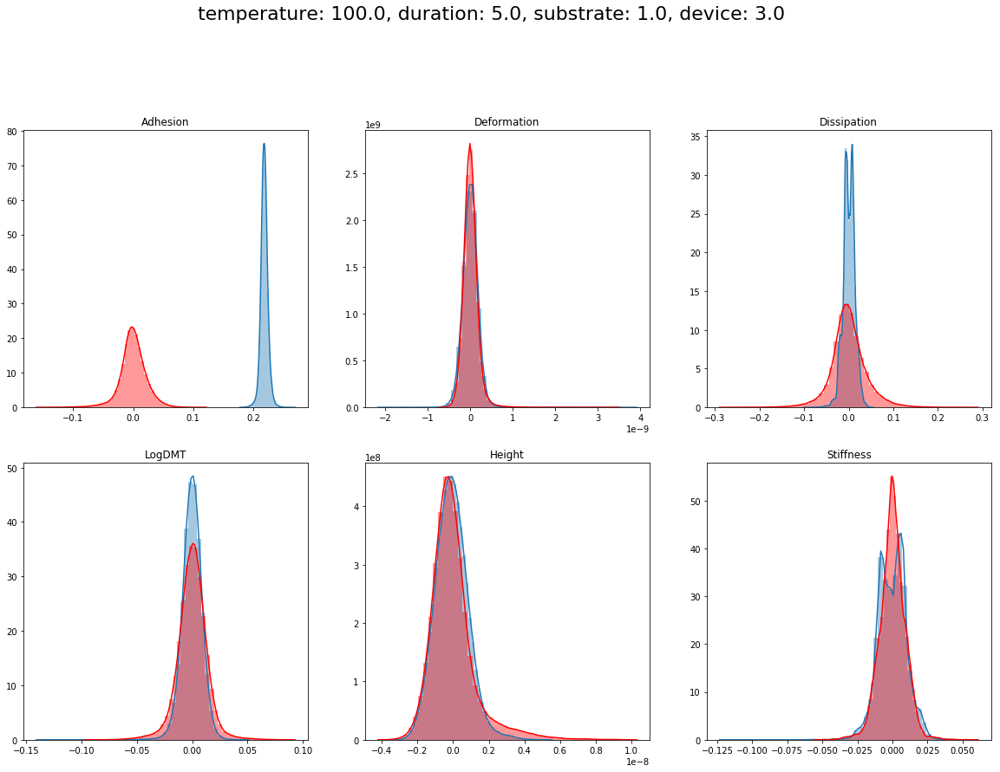

In [416]:
def show_feature_distributions(i, j=None, nbins=100):
    X = get_data(i)
    Y = get_data(j) if j is not None else None
    O = extract_outliers(X)
    OY = extract_outliers(Y) if Y is not None else None
    pyplot.figure(figsize=(20,20))

    title = ", ".join([f"{k}: {v}" for k, v in get_parameters(get_path_from_index(i)).items()])
    pyplot.suptitle(title, fontsize=22)

    for j in range(6):
        x = [X[n,m,j] for n in range(X.shape[0]) for m in range(X.shape[1]) if not O[n,m]]
        y = [Y[n,m,j] for n in range(Y.shape[0]) for m in range(Y.shape[1]) if not O[n,m]] if Y is not None else None
        pyplot.subplot(3, 3, j+1)
        pyplot.title(fields[j])
        sb.distplot(x)
        if y is not None:
            sb.distplot(y, color="red")
        
show_feature_distributions(20, 21)

In [417]:
from tqdm import tqdm

# Compute sample similarity
def pdf_distance(x, y, nbins):
    def get_kl_value(u, v):
        if u == 0 or v == 0:
            return 0
        return u * np.log(u/v)
    
    l = min(min(x), min(y))
    r = max(max(x), max(y))
    bins = np.linspace(l, r, nbins)
    xval = np.array([np.sum((x <= bins[i+1]) * (x >= bins[i])) for i in range(nbins-1)]).astype(float)
    yval = np.array([np.sum((y <= bins[i+1]) * (y >= bins[i])) for i in range(nbins-1)]).astype(float)
    
    xden = np.sum(xval)
    yden = np.sum(yval)
    
    if xden == 0 or yden == 0:
        print(x)
        print(y)
        return np.inf
    
    xval /= xden
    yval /= yden
    return np.sum([(u-v)**2 for u,v in zip(xval, yval)])
    
def distance(X, Y, nbins=100):
    s = [pdf_distance(X[:,:,i].flatten(), Y[:,:,i].flatten(), nbins=nbins) for i in range(X.shape[-1])]
    return np.mean(s)

def flat_distance(X, Y, nbins=100):
    s = [pdf_distance(X[:,i], Y[:,i], nbins=nbins) for i in range(X.shape[-1])]
    return np.mean(s)

## Feature Correlations

In [12]:
def get_correlations():
    N = get_sample_count()
    cors = []
    for i in range(N):
        params = get_parameters(get_path_from_index(i))
        X = get_data(i)
        n, m, d = X.shape
        
        C = np.zeros((d,d))
        for j in range(d):
            for k in range(j, d):
                C[j,k] = C[k,j] = np.corrcoef(X[:,:,j].flatten(), X[:,:,k].flatten())[0][1]
        cors.append({"params": params, "correlation": C})
    return cors

cors = get_correlations()

for cor in cors:
    print("Parameters")
    for k, v in cor["params"].items():
        print(f"\t{k}: {v}")
    print("\n")
    
    print("Max Correlation")
    C = cor["correlation"]
    s = C.shape
    C = C.flatten()
    I = np.argsort(np.abs(C))[::-1]
    
    for i in I:
        if np.abs(C[i]) < 0.5:
            break
        r, c = np.unravel_index(i, s)
        print(f"\t{fields[r]} ({r}) -- {fields[c]} ({c}): {C[i]}")
    print("-"*30)
    print("\n"*2)

/Users/ponl/Projects/MatDat/matdat/lib/python3.6/site-packages/numpy/lib/function_base.py:3183: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/Users/ponl/Projects/MatDat/matdat/lib/python3.6/site-packages/numpy/lib/function_base.py:3184: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


Parameters
	temperature: 100.0
	duration: 10.0
	substrate: 3.0
	device: 1.0


Max Correlation
	Stiffness (5) -- Stiffness (5): 1.0
	Height (4) -- Height (4): 1.0
	Dissipation (2) -- Dissipation (2): 1.0
	LogDMT (3) -- LogDMT (3): 1.0
	Adhesion (0) -- Adhesion (0): 1.0
	Deformation (1) -- Deformation (1): 0.9999999999999998
	Adhesion (0) -- Dissipation (2): 0.6964119304617736
	Dissipation (2) -- Adhesion (0): 0.6964119304617736
	LogDMT (3) -- Stiffness (5): 0.611516136221882
	Stiffness (5) -- LogDMT (3): 0.611516136221882
	Stiffness (5) -- Adhesion (0): -0.5361285184456082
	Adhesion (0) -- Stiffness (5): -0.5361285184456082
	Adhesion (0) -- Height (4): -0.532718755561041
	Height (4) -- Adhesion (0): -0.532718755561041
	Dissipation (2) -- Height (4): -0.5140450353642354
	Height (4) -- Dissipation (2): -0.5140450353642354
------------------------------



Parameters
	temperature: 100.0
	duration: 10.0
	substrate: 3.0
	device: 3.0


Max Correlation
	Stiffness (5) -- Stiffness (5): 1.0
	Hei

/Users/ponl/Projects/MatDat/matdat/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "
/Users/ponl/Projects/MatDat/matdat/lib/python3.6/site-packages/numpy/lib/function_base.py:838: RuntimeWarning: divide by zero encountered in true_divide
  return n/db/n.sum(), bin_edges
/Users/ponl/Projects/MatDat/matdat/lib/python3.6/site-packages/numpy/lib/function_base.py:838: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


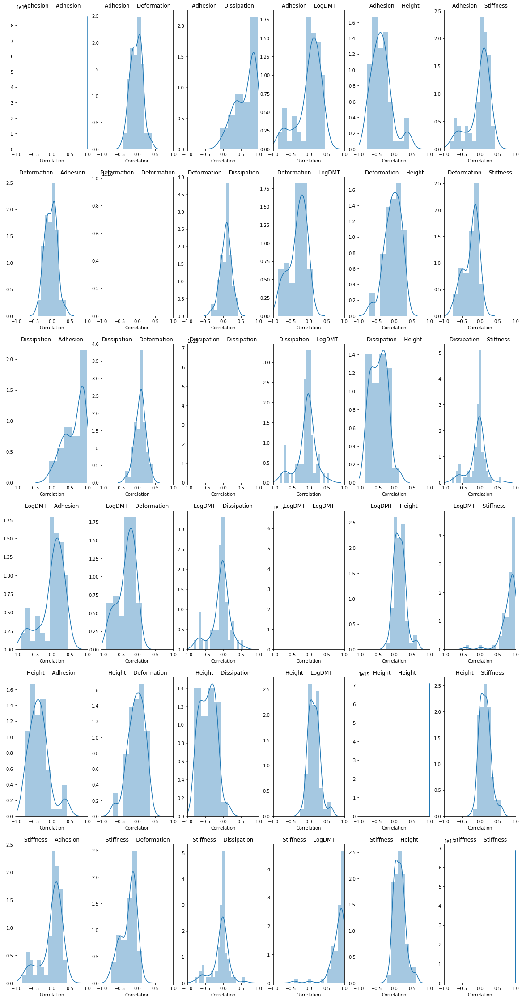

In [351]:
def get_correlation_values(r, c):
    p = []
    for cor in cors:
        t = cor["params"]["temperature"]
        dur = cor["params"]["duration"]
        s = cor["params"]["substrate"]
        dv = cor["params"]["device"]
        p.append((t, dur, s, dv, cor["correlation"][r,c]))
    return p

def plot_correlation(r, c):
    P = get_correlation_values(r, c)
    P.sort(key=lambda p: p[-1])

    P = np.array(P)
    V = [p for p in P[:,-1] if not np.isnan(p)]
    sb.distplot(V)
    pyplot.xlabel("Correlation")
    pyplot.xlim(-1,1)
    return

fig = pyplot.figure(figsize=(20, 40))
cnt = 1
for i in range(6):
    for j in range(6):
        pyplot.subplot(6, 6, cnt)
        pyplot.title(f"{fields[i]} -- {fields[j]}")
        plot_correlation(i, j)
        cnt += 1

# Performing Outlier Detection and Removal

There are some clear outliers in the data which are artifacts of the data collection process. We must remove these outliers before we can begin learning any of the feature distributions.

In [6]:
# Outlier Detection

from scipy import signal

def extract_outliers_pos(X, height_index = 4, threshold=4):
    
    x = X[:,:,height_index]
    flt =    np.array([[0.5, 0.5, 0.5],
                       [0.5, 1, 0.5],
                       [0.5, 0.5, 0.5]])
    y = signal.convolve2d(x, flt, boundary='symm', mode='same')
    
    y[y<0] = 0
    
    u = np.mean(y)
    s = np.std(y)
    z = np.abs((u-y)/s)
    return z > threshold

def extract_outliers_neg(X, height_index = 4, threshold=4):
    x = X[:,:,height_index]
    flt =    np.array([[0.5, 0.5, 0.5],
                       [0.5, 1, 0.5],
                       [0.5, 0.5, 0.5]])
    
    y = signal.convolve2d(x, flt, boundary='symm', mode='same')
    
    y[y>0] = 0
    
    u = np.mean(y)
    s = np.std(y)
    z = np.abs((u-y)/s)
    return z > threshold

def extract_outliers(X, height_index = 4, threshold = 4):
    pos_outliers = extract_outliers_pos(X, height_index, threshold)
    neg_outliers = extract_outliers_neg(X, height_index, threshold)
    outliers = pos_outliers + neg_outliers
    return outliers

X = get_data(75, 10, 4, 2)
fig = pyplot.figure(figsize=(20,10))

pyplot.subplot(121)
pyplot.imshow(X[:,:,4])
pyplot.subplot(122)
pyplot.imshow(extract_outliers(X))

NameError: name 'get_data' is not defined

# Gaussian Mixture Model Segmentation

In [4]:
from collections import Counter
from sklearn.mixture import GaussianMixture

def segment(X, outliers, normal=True):
    n, m, b = X.shape
    
    if normal:
        maxi_vector = [np.max(np.abs(X[:,:,i])) for i in range(b)]
        normal_X = np.zeros(X.shape)
        for i in range(b):
            normal_X[:,:,i] = X[:,:,i] / maxi_vector[i]
    else:
        normal_X = X
    
    n, m, b = normal_X.shape
    V = [normal_X[i,j,:] for i in range(m) for j in range(n) if not outliers[i,j]]
    V_full = [normal_X[i,j,:] for i in range(n) for j in range(m)]
        
    gmm = GaussianMixture(n_components=3, covariance_type='full')
    gmm.fit(V)
    
    l = gmm.predict(V_full)
    return l.reshape(n,m)

In [7]:
#X_original = get_data(63)
X_original = np.load("/Users/diegotorrejon/Projects/Other/MATDAT18_diego/afm/nanowires/combined/100-0_48_NW_combined.npy")

O = extract_outliers(X_original)
X_original[O,:] = 0

# NOTE for old backgrounded data we want to get rid of height since we use it mostly for outlier detection
X = np.delete(X_original, 4, axis=2)

scaled_x = X_original.copy()
scaled_x[O, :] = 0

L = segment(scaled_x, O, False)
L2 = segment(scaled_x, O, True)

L += 1 # move from labels 0,1 to 1,2
L *= (1-O) # outliers map to label 0

L2 += 1 # move from labels 0,1 to 1,2
L2 *= (1-O) # outliers map to label 0

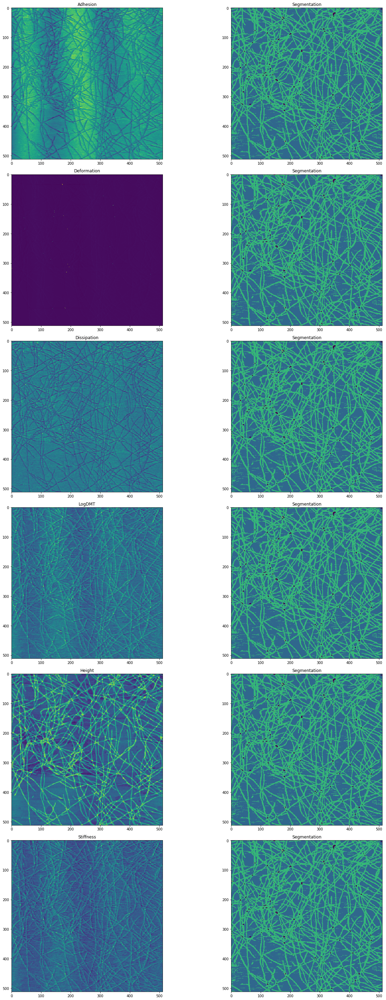

In [10]:
pyplot.figure(figsize=(20,40))

cnt = 1
for i in range(6):
    pyplot.subplot(6,2,cnt)
    pyplot.title(fields[i])
    pyplot.imshow(scaled_x[:,:,i])
    cnt += 1
    
    pyplot.subplot(6,2,cnt)
    pyplot.title("Segmentation")
    pyplot.imshow(L2)
    cnt += 1
    
pyplot.tight_layout()

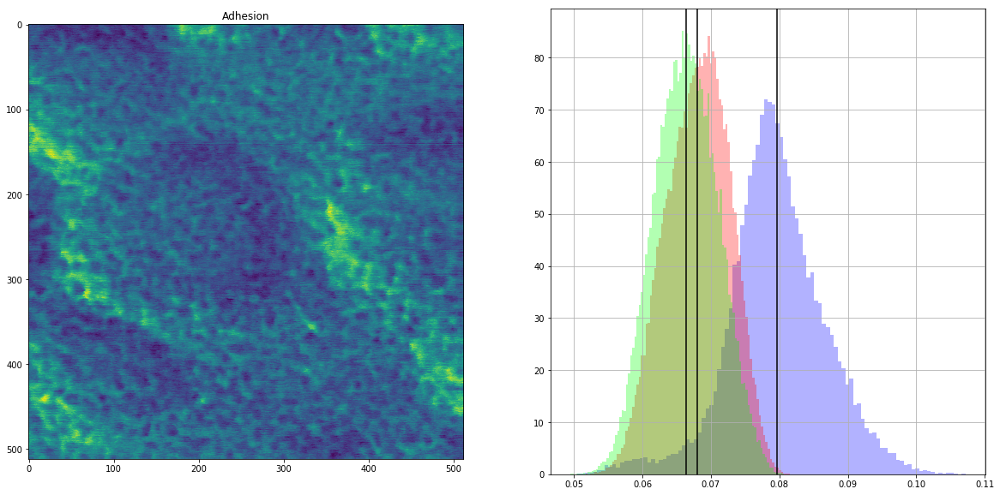

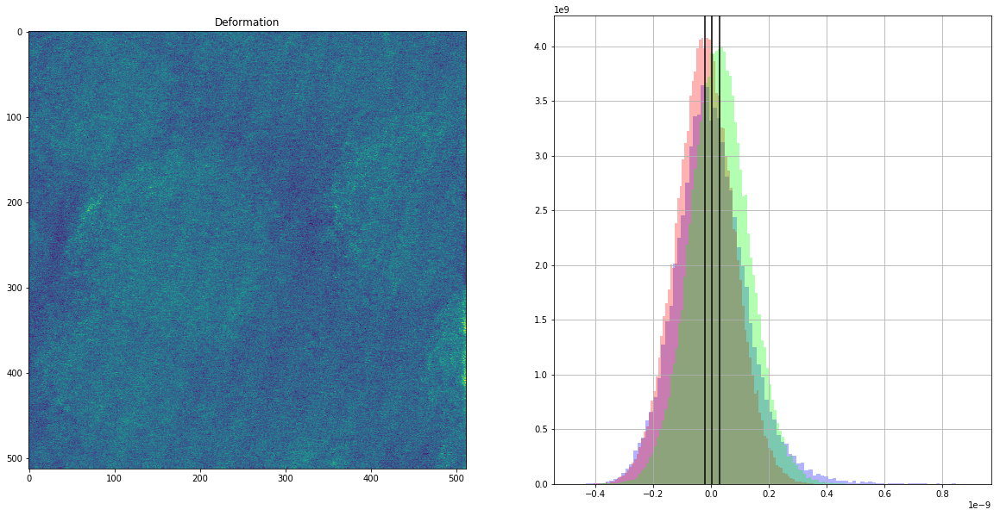

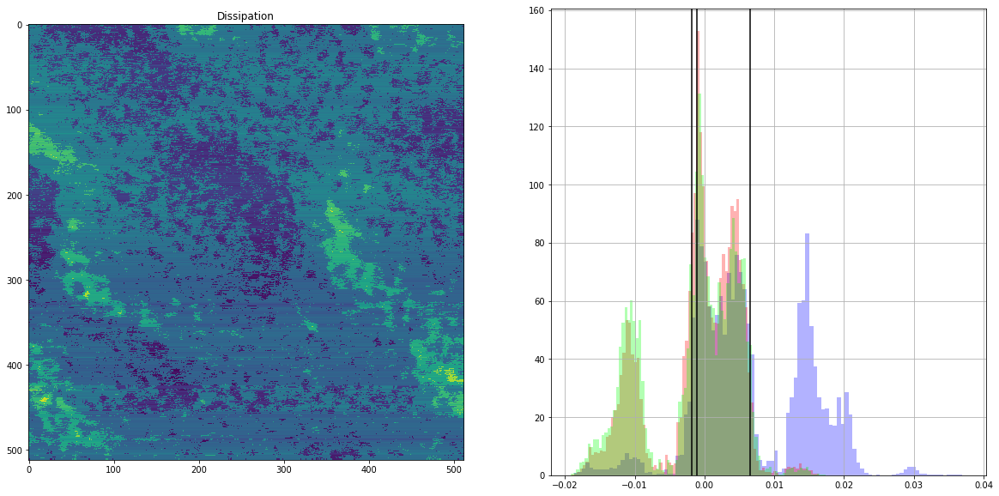

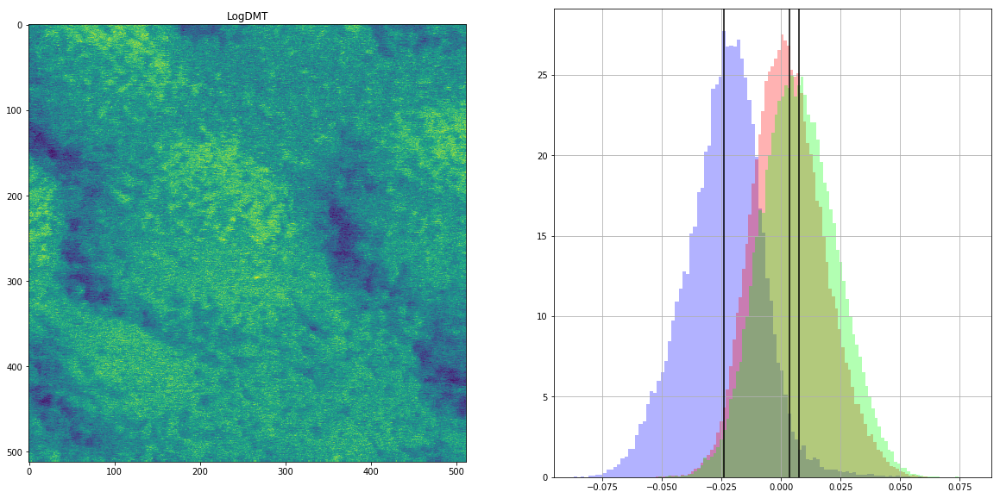

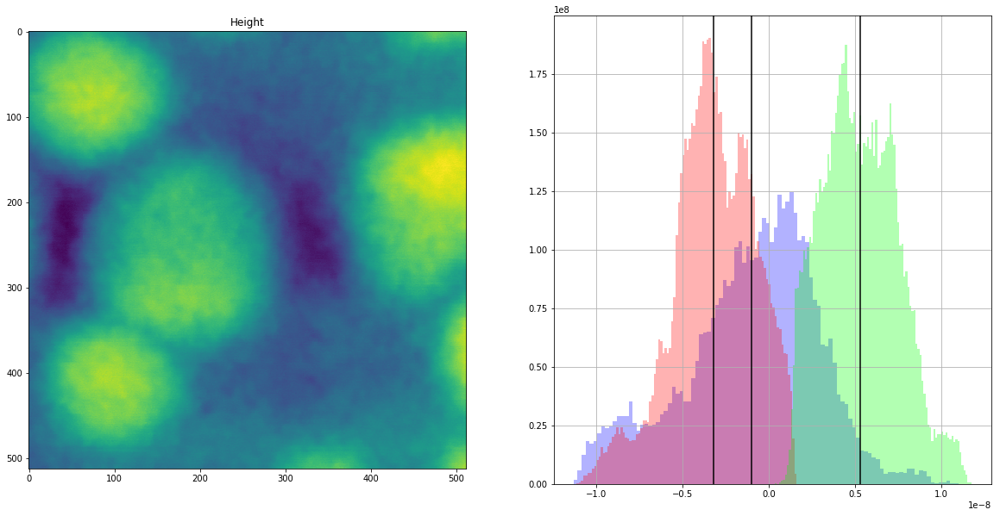

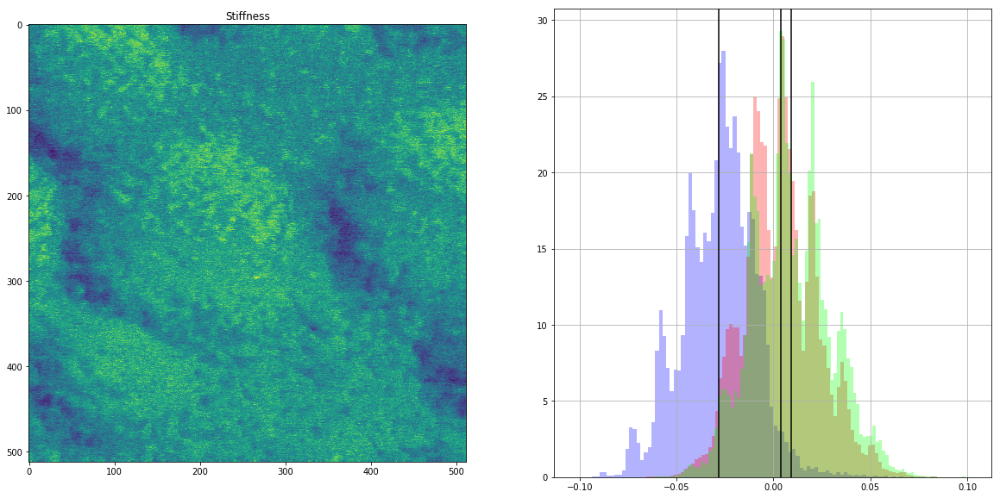

In [613]:
for i in range(6):
    pyplot.figure(figsize=(20,10))
    
    pyplot.subplot(1,2,1)
    pyplot.title(fields[i])
    pyplot.imshow(scaled_x[:,:,i])
    
    pyplot.subplot(1,2,2)
    pyplot.hist(X_original[:,:,i][L2 == 1], 100, fc=(0, 0, 1, 0.3), density=True)
    pyplot.axvline(np.mean(X_original[:,:,i][L2==1]), color='black')

    pyplot.hist(X_original[:,:,i][L2 == 2], 100, fc=(1, 0, 0, 0.3), density=True)
    pyplot.axvline(np.mean(X_original[:,:,i][L2==2]), color='black')

    pyplot.hist(X_original[:,:,i][L2 == 3], 100, fc=(0, 1, 0, 0.3), density=True)
    pyplot.axvline(np.mean(X_original[:,:,i][L2==3]), color='black')
    
    pyplot.grid()
    pyplot.show()

In [13]:
X_original = np.load("/Users/diegotorrejon/Projects/Other/MATDAT18_diego/afm/nanowires/combined/100-0_48_NW-1_combined.npy")

O = extract_outliers(X_original)
X_original[O,:] = 0

# NOTE for old data we want to get rid of height
X = np.delete(X_original, 4, axis=2)

scaled_x = X.copy()
scaled_x[O, :] = 0

L = segment(scaled_x, O, False)
L2 = segment(scaled_x, O, True)

L += 1 # move from labels 0,1 to 1,2
L *= (1-O) # outliers map to label 0

L2 += 1 # move from labels 0,1 to 1,2
L2 *= (1-O) # outliers map to label 0

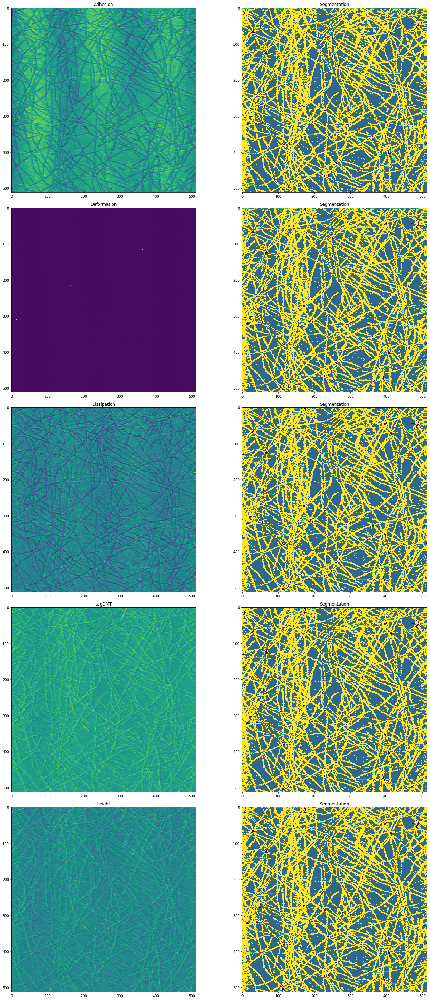

In [14]:
pyplot.figure(figsize=(20,40))

cnt = 1
for i in range(5):
    pyplot.subplot(5,2,cnt)
    pyplot.title(fields[i])
    pyplot.imshow(scaled_x[:,:,i])
    cnt += 1
    
    pyplot.subplot(5,2,cnt)
    pyplot.title("Segmentation")
    pyplot.imshow(L2)
    cnt += 1
    
pyplot.tight_layout()

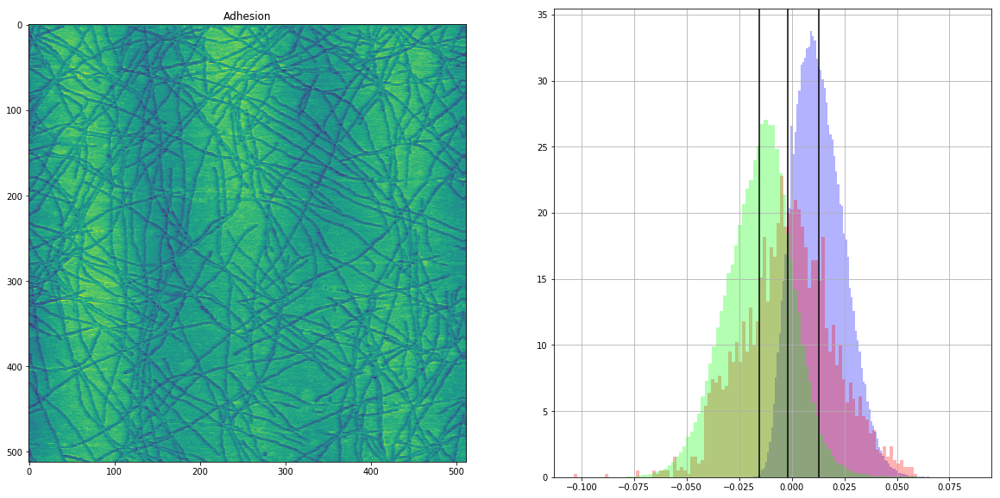

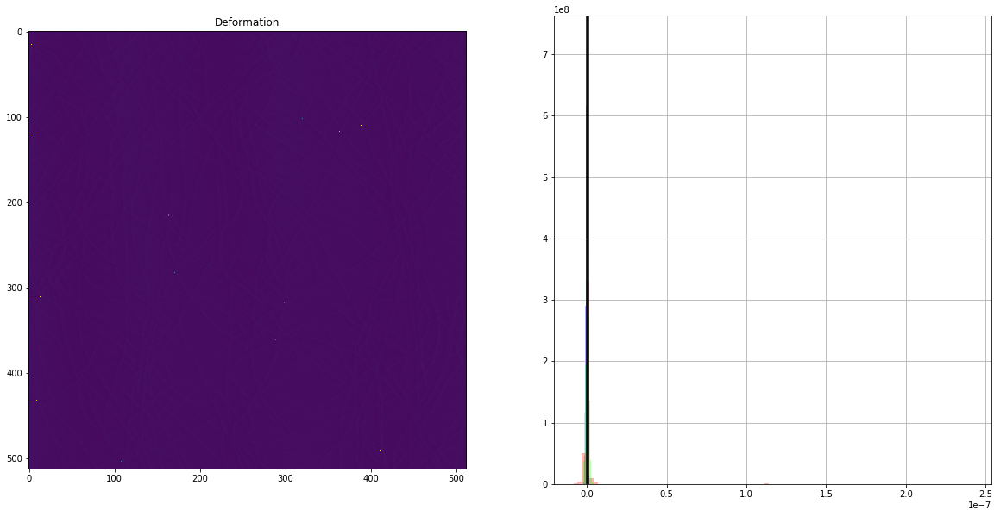

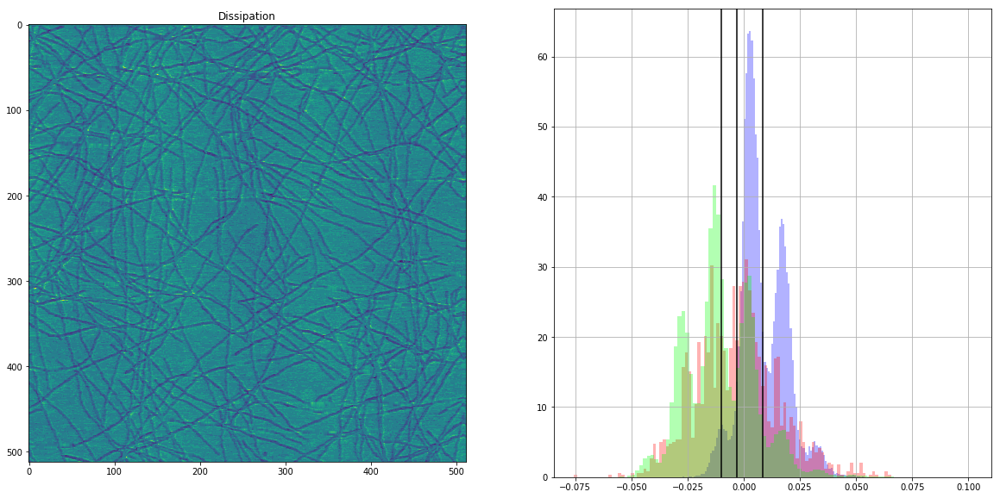

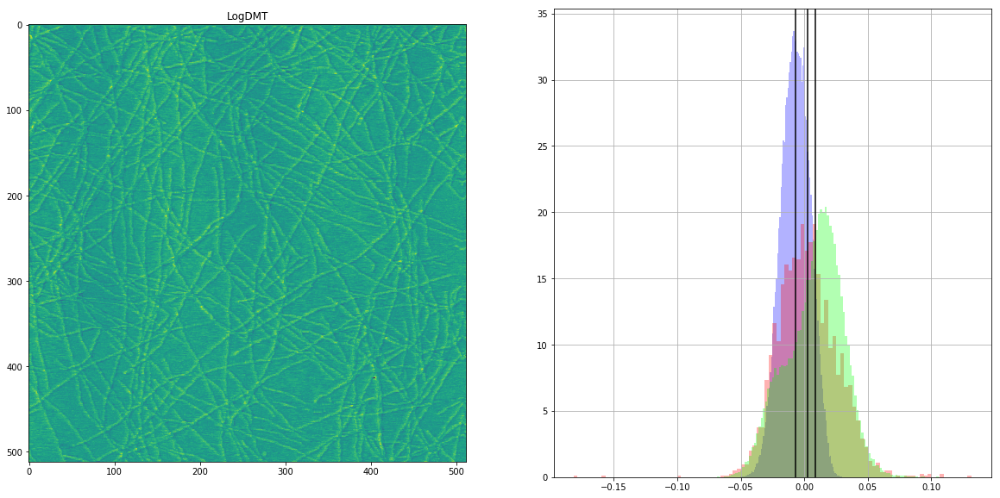

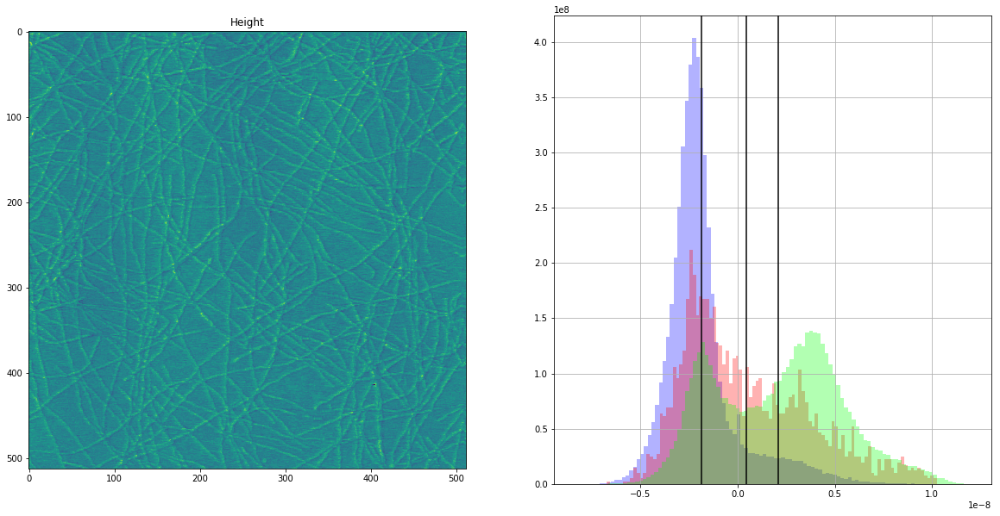

In [15]:
for i in range(5):
    pyplot.figure(figsize=(20,10))
    
    pyplot.subplot(1,2,1)
    pyplot.title(fields[i])
    pyplot.imshow(scaled_x[:,:,i])
    
    pyplot.subplot(1,2,2)
    pyplot.hist(X_original[:,:,i][L2 == 1], 100, fc=(0, 0, 1, 0.3), density=True)
    pyplot.axvline(np.mean(X_original[:,:,i][L2==1]), color='black')

    pyplot.hist(X_original[:,:,i][L2 == 2], 100, fc=(1, 0, 0, 0.3), density=True)
    pyplot.axvline(np.mean(X_original[:,:,i][L2==2]), color='black')

    pyplot.hist(X_original[:,:,i][L2 == 3], 100, fc=(0, 1, 0, 0.3), density=True)
    pyplot.axvline(np.mean(X_original[:,:,i][L2==3]), color='black')
    
    pyplot.grid()
    pyplot.show()

# Persistence Watershed Segmentation

In [14]:
from scipy.spatial import KDTree

def compute_distance(B):
    def onboundary(x):
        if not B[x]:
            return False
        N = get_neighbors(x, B)
        for n in N:
            if not B[n]:
                return True
        return False

    n = B.shape
    print("Computing Positives")
    positives = np.array([(i,j) for i in range(n[0]) for j in range(n[1]) if B[i,j] and onboundary((i,j))])
    print("Computing KD Tree")
    kd = KDTree(positives)
    D = np.empty(B.shape, float)

    print("Computing Distances")
    for i in range(n[0]):
        for j in range(n[1]):
                d, I = nn = kd.query((i,j))
                if not B[i,j]:
                    d *= -1
                D[i,j] = d
    return D

def get_neighbors(xc, X):
    N = []
    for j in range(-1, 2):
        for k in range(-1, 2):
            if j == 0 and k == 0:
                continue
            nr = xc[0] + j
            nc = xc[1] + k
            if nr < 0 or nc < 0 or nr >= X.shape[0] or nc >= X.shape[1]:
                continue
            N.append((xc[0]+j, xc[1]+k))
    return N

In [55]:
import numpy as np
from collections import defaultdict

class PersistenceWatershed(object):
    def __init__(self, arr):
        self.WSHED = 0
        self.INIT = -1
        self.arr = arr
        self.dim = self.arr.shape
        self.lab = np.empty(self.dim, dtype=int)
        self.lab.fill(self.INIT)
        self.dual = {}
        self.current_label = 1
        self.maxes = {}
        self.mt = None

    def train(self):
        # Mean center
        u = np.mean(self.arr.flatten())
        s = np.std(self.arr.flatten())
        self.arr -= u
        self.arr /= s
        
        rank = np.argsort(self.arr.flatten())
        for r in rank[::-1]:
            p = np.unravel_index(r, self.dim)
            L = self.get_neighbor_labels(p)
            
            if len(L) == 0:
                # assign new label
                l = self.current_label
                self.current_label += 1
                
                self.lab[p] = l
                self.dual[l] = {}
                self.maxes[l] = self.arr[p]
                
            elif len(L) == 1:
                # assign existing label
                self.lab[p] = list(L)[0]
                
            else:
                # Watershed - Connect adjacent labels
                w = self.arr[p]
                self.lab[p] = self.WSHED
                
                for l0 in L:
                    for l1 in L:
                        if l0 == l1:
                            continue
                        
                        n0, n1 = [min(l0,l1), max(l0,l1)]
                        if n1 not in self.dual[n0]:
                            self.dual[n0][n1] = -1 * np.inf
                            
                        self.dual[n0][n1] = max(self.dual[n0][n1], w)
                        
        # Create edge list
        edges = []
        for n0 in self.dual:
            for n1 in self.dual[n0]:
                edges.append((n0, n1, self.dual[n0][n1]))
        
        self.mt = PersistenceWatershed.merge_tree(self.maxes, edges)

    def apply_threshold(self, t):
        # Build relabel dictionary
        relabel = {i: i for i in range(self.current_label)}
        for e in self.mt:
            if e[2] < t:
                relabel[e[0]] = e[1]
        
        # Perform relabeling
        rlab = np.empty(self.dim, dtype=int)
        wvox = []
        for i in range(self.lab.size):
            p = np.unravel_index(i, self.dim)
            l = self.lab[p]
            if l == self.WSHED:
                rlab[p] = 0
                wvox.append(p)
                continue
            rlab[p] = PersistenceWatershed.find(relabel, self.lab[p])

        # Clean up false watersheds
        for p in wvox:
            L = self.get_neighbor_labels(p, rlab)
            if len(L) == 1:
                rlab[p] = list(L)[0]
                
        # Clean labels to avoid skips
        ol2cl = {k: i+1 for i, k in enumerate(set(rlab.flatten())) if k != 0}
        ol2cl[0] = 0
        for i in range(rlab.shape[0]):
            for j in range(rlab.shape[1]):
                rlab[i,j] = ol2cl[rlab[i,j]]
                
        return rlab

    def get_neighbor_labels(self, p, source=None):
        N = PersistenceWatershed.get_neighbors(p, self.arr.shape)
        L = set()
        for n in N:
            l = source[n] if source is not None else self.lab[n]
            if l != self.INIT and l != self.WSHED:
                L.add(l)
        return L
    
    @staticmethod
    def get_neighbors(p, bounds, k=1):
        N = [(p[0]+i, p[1]+j) for i in range(-k, k+1) for j in range(-k, k+1)]
        N = [n for n in N if (PersistenceWatershed.inbounds(n, bounds) and not (n[0] == p[0] and n[1] == p[1]))]
        return N

    @staticmethod
    def inbounds(p, bounds):
        return np.prod([0 <= p[i] < bounds[i] for i in range(2)])
    
    @staticmethod
    def find(components, u):
        while components[u] != u:
            u = components[u]
        return u

    @staticmethod
    def merge_tree(maxima, edges):
        pairs = []
        values = {}
        components = {}

        for (u,val) in maxima.items():
            values[u] = val
            components[u] = u

        # Sort by edge height
        edges.sort(key=lambda x: x[2], reverse=True)

        for e in edges:
            u, v, val = e
            uc = PersistenceWatershed.find(components, u)
            vc = PersistenceWatershed.find(components, v)
            if uc == vc:
                continue

            if values[vc] < values[uc]:
                uc, vc = vc, uc

            # source, target, persistence
            pairs.append((uc, vc, values[uc] - val))
            components[uc] = components[vc]

        return pairs


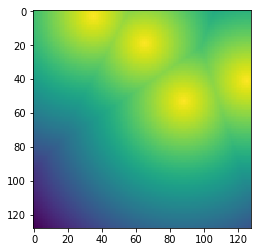

In [20]:
# Persistence Watershed Test Set

D = np.zeros((128, 128))

sources = []
for i in range(4):
    sources.append((np.random.randint(128), np.random.randint(128)))
    
for i in range(128):
    for j in range(128):
        d = min([(i-u)**2 + (j-v)**2 for u,v in sources])
        D[i,j] = np.sqrt(d)
        
pyplot.imshow(-1 * D)

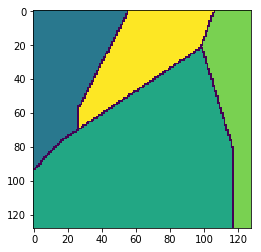

In [21]:
pws = PersistenceWatershed(-1 * D)
pws.train()
L = pws.apply_threshold(0.5)
pyplot.imshow(L)

In [478]:
H = X[:,:,4]
H = (H - np.mean(H)) / np.std(H)

flt = np.ones((3,3))
flt[1,1] = 2
flt /= 2
H = convolve2d(H, flt, mode="same")

pws = PersistenceWatershed(H)
pws.train()

In [479]:
L = pws.apply_threshold(1)

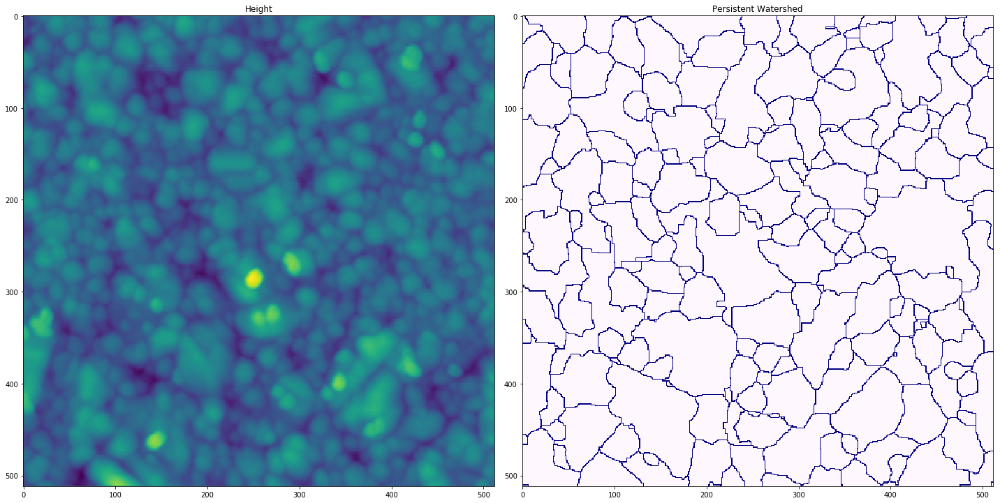

In [480]:
fig = pyplot.figure(figsize=(20,20))
pyplot.subplot(121)
pyplot.title(fields[4])
pyplot.imshow(H)

pyplot.subplot(122)
pyplot.title("Persistent Watershed")
pyplot.imshow(L != 0, cmap="gist_ncar")
pyplot.tight_layout()

# Feature Space Embedding and GMM

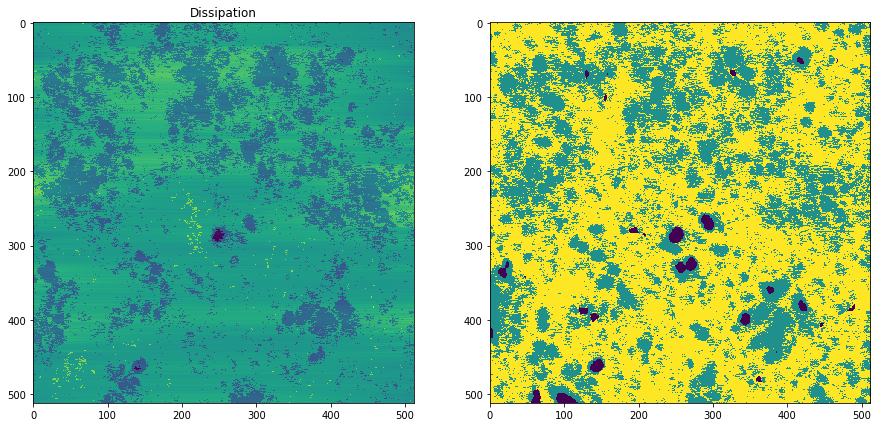

In [498]:
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler

def embed(X, ndim=3, outliers=None):
    n, m, d = X.shape
    
    if outliers is None:
        outliers = set()
    else:
        oset = set()
        for i in range(n):
            for j in range(m):
                if outliers[i,j]:
                    oset.add((i,j))
        outliers = oset

    # -- Build feature embedding
    V = []
    V_full = []
    for i in range(n):
        for j in range(m):
            V_full.append(X[i, j, :])
            
            if (i,j) in outliers:
                continue
                
            V.append(X[i, j, :])
    
    # Scale
    sst = StandardScaler()
    V_scaled = sst.fit_transform(np.array(V))
    V_full_scaled = sst.transform(np.array(V_full))
    
    # Covariance Matrix
    pca = PCA(n_components=ndim)
    
    pca.fit(V_scaled)
    Y = pca.transform(V_full_scaled)
    
    return Y

def reduce_and_fit_gmm(X, ndim=3, ncmp=2):
    O = extract_outliers(X)
    Y = embed(X, ndim=ndim, outliers=O)
    gmm = GaussianMixture(n_components=ncmp)
    gmm.fit(Y)
    L = np.reshape(gmm.predict(Y), (X.shape[0], X.shape[1]))
    L += 1
    L *= (1-O)
    return L

X = get_data(7)
L = reduce_and_fit_gmm(X, ndim=3, ncmp=2)

pyplot.figure(figsize=(15,15))
pyplot.subplot(121)
pyplot.title(fields[2])
pyplot.imshow(X[:,:,2])
pyplot.subplot(122)
pyplot.imshow(L)

## Visualizing the feature embeddings

In [23]:
X = get_data(7)

O = extract_outliers(X)
Y = embed(X, ndim=3, outliers=O)

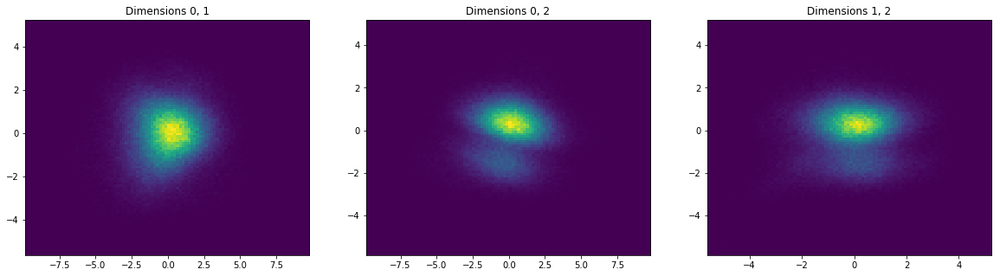

In [29]:
pyplot.figure(figsize=(20,5))
pyplot.subplot(131)
pyplot.title("Dimensions 0, 1")
h = pyplot.hist2d(Y[:,0], Y[:,1], bins=100)
pyplot.subplot(132)
pyplot.title("Dimensions 0, 2")
h = pyplot.hist2d(Y[:,0], Y[:,2], bins=100)
pyplot.subplot(133)
pyplot.title("Dimensions 1, 2")
h = pyplot.hist2d(Y[:,1], Y[:,2], bins=100)

## Feature neighborhood embedding

In [533]:
from sklearn.decomposition import PCA
from scipy.signal import convolve2d

class FeatureNeighborhoodEmbedding(object):
    def __init__(self, X, ncomp, padding=3, ndim=3, final_dim=6):
        self.X = X
        self.Z = None
        self.nrow = X.shape[0]
        self.ncol = X.shape[1]
        self.nfeatures = X.shape[2]
        
        self.padding = padding
        self.ndim = ndim
        self.ncomp = ncomp
        self.final_dim = final_dim

        self.maxes = np.zeros(self.nfeatures)
        self.mins = np.zeros(self.nfeatures)
        self.means = np.zeros(self.nfeatures)
        self.pcas = [None for _ in range(self.nfeatures)]
        self.final_pca = None
        self.gmm = GaussianMixture(n_components=ncomp, covariance_type="full")
        
    def get_window(self, i, j, d):
        Y = self.X[:,:,d]
        w = np.zeros((self.padding*2 + 1, self.padding*2 + 1))
        r = 0
        for di in range(-self.padding, self.padding+1):
            c = 0
            for dj in range(-self.padding, self.padding+1):
                u = i + di
                v = j + dj
                if 0 <= u < self.nrow and 0 <= v < self.ncol:
                    w[r,c] = Y[u,v]
                else:
                    w[r,c] = Y[i,j]
                c += 1
            r += 1
        return w
    
    def fit(self):
        print("Learing Embeddings")
        self._learn_embeddings()
        
        print("Applying Embeddings")
        self._apply_embedding()
        
        print("Learning Final Embedding")
        self._learn_final_embedding()
        
        print("Learning Mixture Model")
        self._learn_mixture_model()

    def _learn_single_embedding(self, d):
        W = []
        for i in range(self.nrow):
            for j in range(self.ncol):
                w = self.get_window(i, j, d)
                W.append(w.flatten())
                
        W = np.array(W)

        self.mins[d] = np.min(W)
        self.maxes[d] = np.max(W)
        self.means[d] = np.mean(W)
        
        W = (W - self.mins[d]) / (self.maxes[d] - self.mins[d])
        pca = PCA(n_components=self.ndim)
        pca.fit(W)
        self.pcas[d] = pca
        return

    def _learn_embeddings(self):
        # Train feature extractors
        pcas, params = [], []
        for i in range(self.nfeatures):
            print(f"\tTraining feature {i}")
            self._learn_single_embedding(i)

    def _apply_embedding(self):
        Z = np.zeros((self.nrow, self.ncol, self.ndim * self.nfeatures))

        for d in range(self.nfeatures):
            Y = (self.X[:,:,d] - self.mins[d]) / (self.maxes[d] - self.mins[d])

            pca = self.pcas[d]

            for b, cmp in enumerate(pca.components_):
                flt_size = int(np.sqrt(len(cmp)))
                flt = cmp.reshape((flt_size, flt_size))
                Z[:,:,3 * d + b] = convolve2d(Y, flt, mode="same", fillvalue=self.means[d])
                
        self.Z = Z
        
    def _learn_final_embedding(self):
        self.final_pca = PCA(n_components=self.final_dim)
        T = [self.Z[i,j,:] for i in range(self.nrow) for j in range(self.ncol)]
        e = self.final_pca.fit_transform(T)
        self.Z = e.reshape((self.nrow, self.ncol, self.final_dim))
    
    def _learn_mixture_model(self):
        T = [self.Z[i,j,:] for i in range(self.nrow) for j in range(self.ncol)]
        self.gmm.fit(T)

    def transform(self):
        T = [self.Z[i,j,:] for i in range(self.nrow) for j in range(self.ncol)]
        L = self.gmm.predict(T)
        L = L.reshape((self.Z.shape[0], self.Z.shape[1]))
        return L
    
    def fit_transform(self):
        self.fit()
        return self.transform()

In [588]:
X_full = get_data(5)
X = get_heightless_data(5)
FNE = FeatureNeighborhoodEmbedding(X, 3, padding=3, ndim=6, final_dim=3)

FNE.fit()
L = FNE.transform()
O = extract_outliers(X_full)

Learing Embeddings
	Training feature 0
	Training feature 1
	Training feature 2
	Training feature 3
	Training feature 4
Applying Embeddings
Learning Final Embedding
Learning Mixture Model


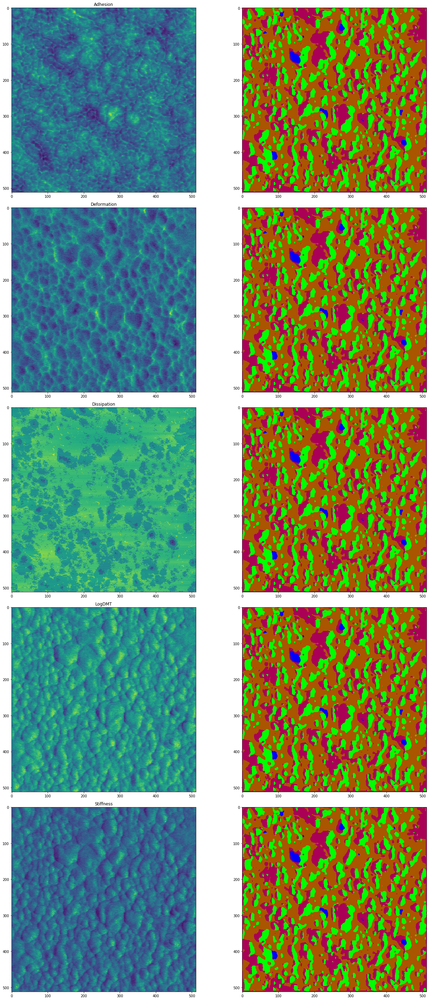

In [589]:
pyplot.figure(figsize=(20,40))

cnt = 1
for i in range(5): 
    pyplot.subplot(5,2,cnt)
    pyplot.title(fields_compact[i])
    pyplot.imshow(X[:,:,i])
    cnt += 1
    
    pyplot.subplot(5,2,cnt)
    pyplot.imshow((L + 1) * (1 - O), cmap="brg")
    cnt += 1
    
pyplot.tight_layout()

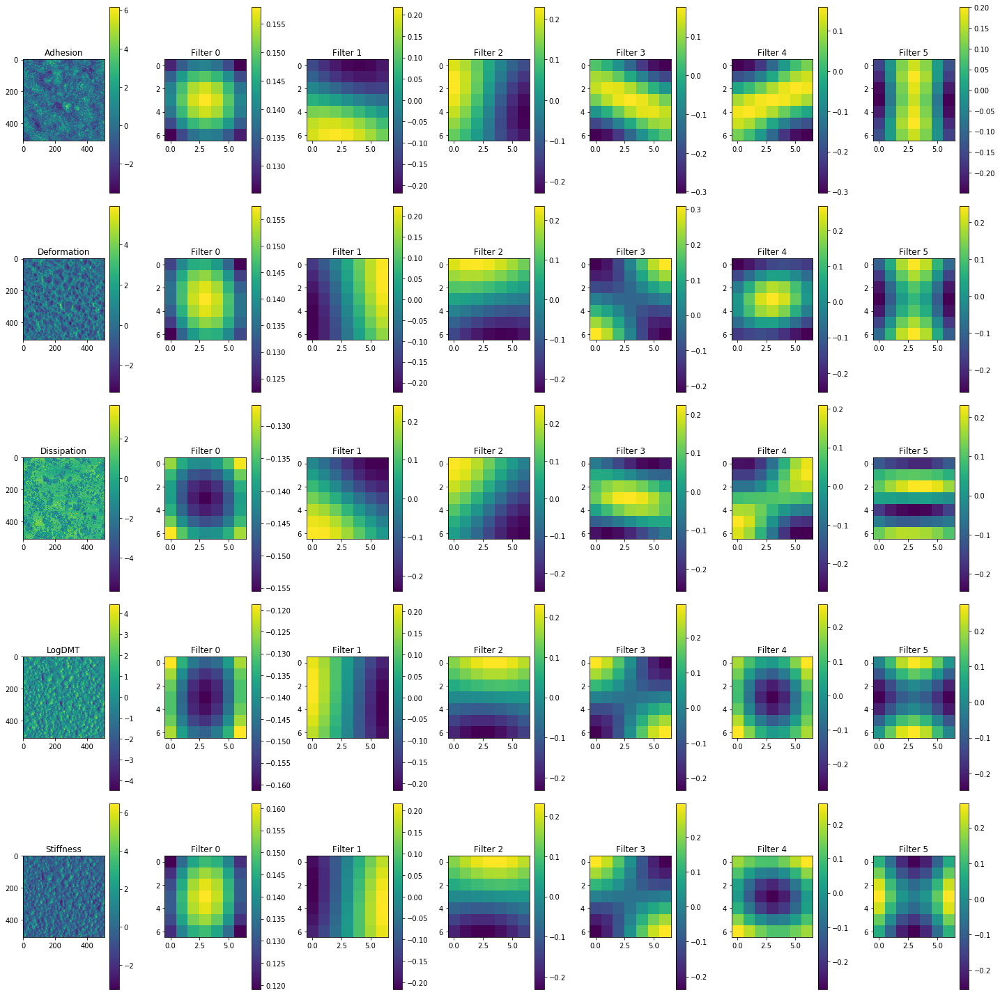

In [595]:
pyplot.figure(figsize=(20,20))

cnt = 1
for i in range(5):
    pyplot.subplot(5, FNE.ndim + 1, cnt)
    pyplot.title(fields_compact[i])
    pyplot.imshow((X[:,:,i] - np.mean(X[:,:,i])) / np.std(X[:,:,i]))
    pyplot.colorbar()
    cnt += 1
    
    pca = FNE.pcas[i]
    for f, cmp in enumerate(pca.components_):
        
        pyplot.subplot(5, len(pca.components_) + 1, cnt)
        pyplot.title(f"Filter {f}")
        pyplot.imshow(cmp.reshape((7,7)))
        pyplot.colorbar()
        cnt += 1

pyplot.tight_layout()

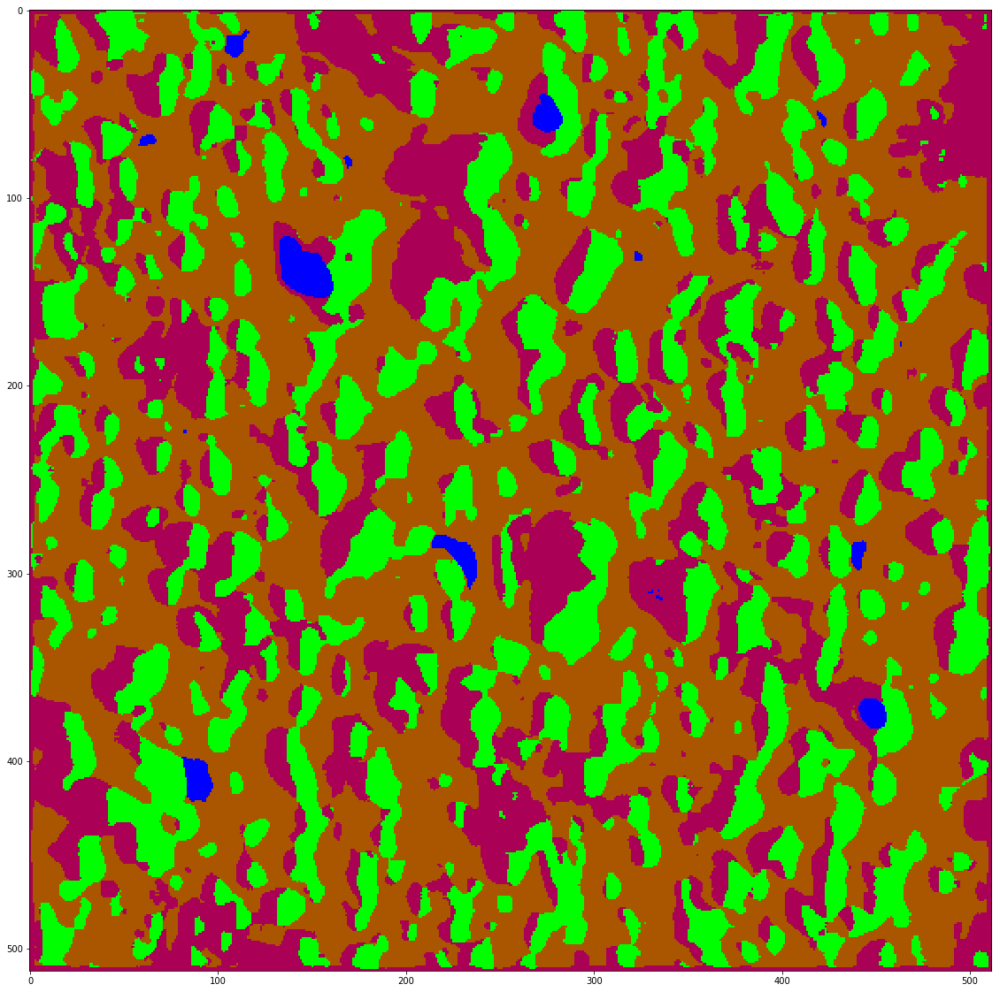

In [591]:
pyplot.figure(figsize=(20,20))
pyplot.imshow((L + 1) * (1 - O), cmap="brg")

/Users/ponl/Projects/MatDat/matdat/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


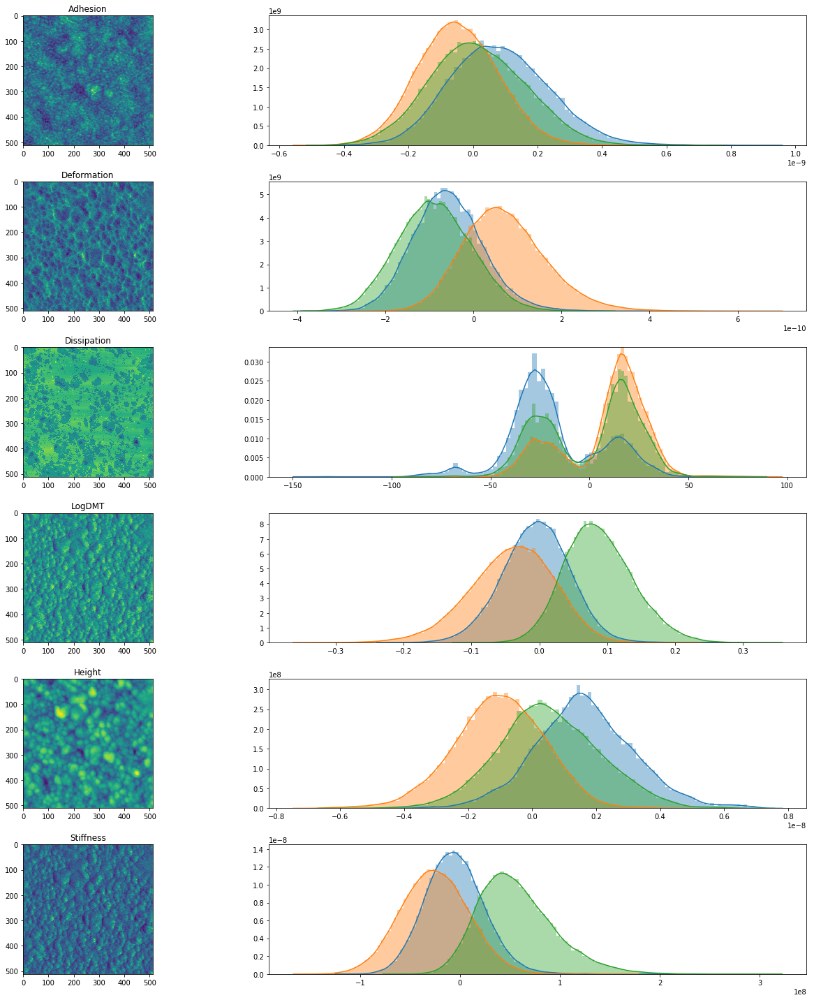

In [596]:
def plot_label_distributions(X, L):
    pyplot.figure(figsize=(20,20))
    L = L.flatten()
    nlabel = len(set(L))
    
    cnt = 1
    for i in range(6):
        pyplot.subplot(6, 2, cnt)
        pyplot.title(fields[i])
        pyplot.imshow(X[:,:,i])
        cnt += 1
        
        pyplot.subplot(6, 2, cnt)
        x = X[:,:,i].flatten()
        for l in range(nlabel):
            V = [x[j] for j in range(len(x)) if L[j] == l]
            sb.distplot(V, bins=100)
        cnt += 1
    pyplot.tight_layout()

plot_label_distributions(X_full, L)

# Independent GMM Model

In [390]:
class IndependentGMM(object):
    def __init__(self, ncomp=2):
        self.ncomp = ncomp
        self.gmms = []
        
    def fit(self, X, O):
        for d in range(X.shape[2]):
            x = IndependentGMM.normalize(X[:,:,d])
            g = GaussianMixture(n_components=self.ncomp)
            g.fit(x.flatten().reshape(-1,1))
            self.gmms.append(g)
            
    @staticmethod
    def normalize(x):
        return (x - np.min(x)) / (np.max(x) - np.min(x))
            
    def transform(self, X, O):
        L = []
        
        for d in range(X.shape[2]):
            x = IndependentGMM.normalize(X[:,:,d])
            y = self.gmms[d].predict(x.flatten().reshape(-1,1))
            L.append(y.reshape((X.shape[0], X.shape[1])))
        
        L = np.array(L)
        L = np.moveaxis(L, 0, 2)
        
        labels = {tuple(L[i,j,:]) for i in range(L.shape[0]) for j in range(L.shape[1])}
        label2id = {l: i for i, l in enumerate(labels)}
            
        Y = np.zeros((X.shape[0], X.shape[1]), dtype=int)
        for i in range(X.shape[0]):
            for j in range(X.shape[1]):
                Y[i,j] = label2id[tuple(L[i,j,:])]
        
        return Y

In [391]:
X_full = np.load("/Users/ponl/Dropbox (Blacksky)/MATDAT2018/AFM/2ComponentFilms/Combined/PTB7PC71BM_CBonly_ascast_fresh_500 nm_combined.npy")

#X_full = get_data(7)
O = extract_outliers(X_full)

#X = get_heightless_data(7)
X = np.load("/Users/ponl/Dropbox (Blacksky)/MATDAT2018/AFM/2ComponentFilms/Combined/PTB7PC71BM_CBonly_ascast_fresh_500 nm_combined.npy")
X = np.delete(X, 4, axis=2)

ig = IndependentGMM()
ig.fit(X, O)

Z = ig.transform(X, O)

print(f"Found {len(set(Z.flatten()))} Classes")

Found 30 Classes


In [392]:
from scipy.cluster.hierarchy import linkage, dendrogram

def get_class_similarity(X, Z):
    V = defaultdict(list)
    
    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            l = Z[i,j]
            V[l].append(X[i,j,:])
            
    nlab = len(V)
    i2l = {i: l for i, l in enumerate(V.keys())}
    sim = np.zeros((nlab, nlab))

    for i in range(nlab):
        for j in range(i+1, nlab):
            
            l0, l1 = i2l[i], i2l[j]
            sim[i,j] = sim[j,i] = flat_distance(np.array(V[l0]), np.array(V[l1]), nbins=100)
    
    return sim

def get_dendrogram(S):
    S_cond = [S[i,j] if S[i,j] < np.inf else 9999 for i in range(S.shape[0]) for j in range(i+1, S.shape[1])]
    l = linkage(S_cond)
    return dendrogram(l)

In [393]:
S = get_class_similarity(X, Z)

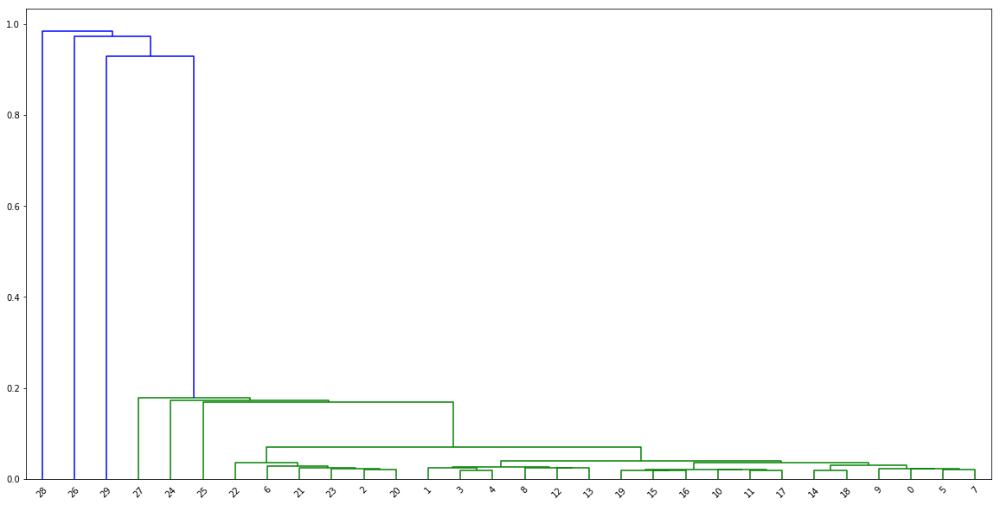

In [394]:
pyplot.figure(figsize=(20,10))
d = get_dendrogram(S)

In [395]:
def find(components, u):
    while components[u] != u:
        u = components[u]
    return u

def relabel(Z, S, threshold):
    #threshold = sorted(set(S.flatten()), reverse=True)[nclass]
    #print(f"Set Threshold: {threshold}")
    nlab = len(S)
    relab = {l: l for l in range(nlab)}
    for i in range(nlab):
        for j in range(i+1, nlab):
            if S[i,j] < threshold:
                relab[i] = j
                
    n, m = Z.shape
    L = np.zeros((n,m), dtype=int)
    for i in range(n):
        for j in range(m):
            L[i,j] = find(relab, Z[i,j])
            
    # Start labeling from 0
    old2new = {l: i for i, l in enumerate(set(L.flatten()))}
    for i in range(n):
        for j in range(m):
            L[i,j] = old2new[L[i,j]]
            
    return L

4


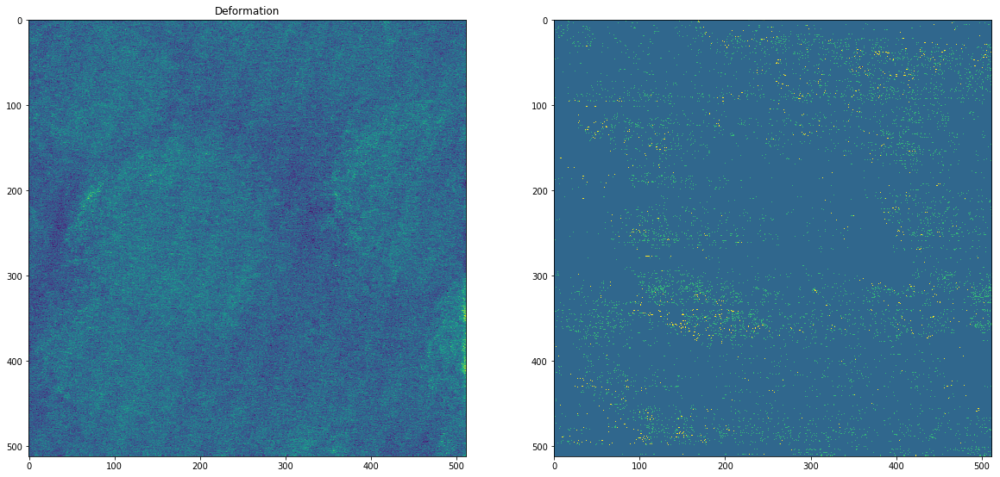

In [396]:
pyplot.figure(figsize=(20,20))
pyplot.subplot(1,2,1)
pyplot.title(fields[1])
pyplot.imshow(X[:,:,1])
pyplot.subplot(1,2,2)
W = relabel(Z, S, threshold=.3)
print(len(set(W.flatten())))
pyplot.imshow(W)

In [323]:
len(set(W.flatten()))

5

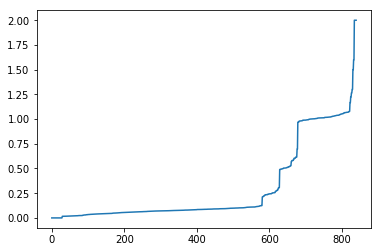

In [321]:
pyplot.plot(sorted(S.flatten()))

In [ ]:
np.zeros((512,512,6), dt